# Import libraries

In [1]:
import os
import warnings

import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.cm as cm

import seaborn as sns

from matplotlib.colors import ListedColormap

from pybaselines import Baseline

from scipy.signal import savgol_filter

from sklearn.preprocessing import MinMaxScaler

from tqdm import tqdm

In [2]:
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', 50)

In [3]:
path_to_save = './../results/01b_preprocessing'

# Loading data

## FTIR-spectra

In [4]:
path_to_data= './../data/parsed_data'

In [5]:
initial_data = pd.read_csv(f'{path_to_data}/ftir_raw_spectra.csv', sep=';', index_col=0)

initial_data.columns = initial_data.columns.astype(float)

print(initial_data.shape)
initial_data.head(3)

(75, 3733)


,3998.31069,3997.34631,3996.38194,3995.41756,3994.45318,3993.48880,3992.52442,3991.56005,3990.59567,3989.63129,3988.66691,3987.70253,3986.73816,3985.77378,3984.80940,3983.84502,3982.88065,3981.91627,3980.95189,3979.98751,3979.02313,3978.05876,3977.09438,3976.13000,3975.16562,...,422.39751,421.43313,420.46876,419.50438,418.54000,417.57562,416.61124,415.64687,414.68249,413.71811,412.75373,411.78935,410.82498,409.86060,408.89622,407.93184,406.96747,406.00309,405.03871,404.07433,403.10995,402.14558,401.18120,400.21682,399.25244
division_1_size_bulk,-0.008580,-0.008580,-0.008580,-0.008580,-0.008580,-0.008580,-0.008580,-0.008612,-0.008578,-0.008559,-0.008554,-0.008587,-0.008574,-0.008486,-0.008457,-0.008504,-0.008556,-0.008586,-0.008602,-0.008547,-0.008460,-0.008443,-0.008471,-0.008505,-0.008509,...,0.005667,0.005664,0.005700,0.005717,0.005726,0.005732,0.005741,0.005662,0.005531,0.005438,0.005388,0.005372,0.005361,0.005383,0.005366,0.005290,0.005246,0.005210,0.005174,0.005174,0.005174,0.005174,0.005174,0.005174,0.005174
division_1_size_5,-0.008005,-0.008005,-0.008005,-0.008005,-0.008005,-0.008005,-0.008005,-0.008121,-0.008191,-0.008250,-0.008269,-0.008278,-0.008247,-0.008157,-0.008120,-0.008136,-0.008145,-0.008111,-0.008079,-0.008044,-0.007976,-0.007943,-0.007927,-0.007923,-0.007929,...,0.010026,0.010000,0.009974,0.009935,0.009883,0.009873,0.009853,0.009706,0.009551,0.009473,0.009416,0.009341,0.009259,0.009198,0.009123,0.009064,0.009072,0.009097,0.009078,0.009078,0.009078,0.009078,0.009078,0.009078,0.009078
division_1_size_3,-0.003743,-0.003743,-0.003743,-0.003743,-0.003743,-0.003743,-0.003743,-0.003775,-0.003766,-0.003757,-0.003773,-0.003883,-0.003973,-0.003965,-0.003945,-0.003949,-0.003970,-0.003917,-0.003853,-0.003797,-0.003700,-0.003678,-0.003729,-0.003794,-0.003794,...,0.005184,0.005200,0.005233,0.005221,0.005201,0.005209,0.005200,0.005069,0.004923,0.004889,0.004884,0.004844,0.004761,0.004684,0.004632,0.004606,0.004621,0.004636,0.004621,0.004621,0.004621,0.004621,0.004621,0.004621,0.004621


## Samples description

In [6]:
samples_description = pd.read_csv(f'{path_to_data}/samples_description.csv', sep=';', index_col=0)

print(samples_description.shape)
samples_description.head(3)

(75, 6)


,Row_ID,Division,Size,Fraction_hue,Fraction_grouped_hue,Class
division_1_size_bulk,1,1,bulk,$> 0$,$d > 5$,2
division_1_size_5,2,1,5,$< 5$,$2 < d \leq 5$,1
division_1_size_3,3,1,3,$< 3$,$2 < d \leq 5$,1


# Data preprocessing

## Waverange selection

In [7]:
initial_data = initial_data.loc[:, (initial_data.columns >= 400) & (initial_data.columns <= 4000)]

## Baseline correction

In [8]:
data_bc = initial_data.copy()

wavenumber = data_bc.columns.astype(float).values
sort_idx = np.argsort(wavenumber)
wavenumber_sorted = wavenumber[sort_idx]

data_bc = data_bc[data_bc.columns[sort_idx]]

for idx in data_bc.index:
    wavenumber = data_bc.columns.astype(float).values
    intensity = data_bc.loc[idx]
    
    baseline_fitter = Baseline(x_data=wavenumber_sorted)
    baseline, _ = baseline_fitter.rubberband(intensity) # .asls(intensity, lam=1e6, p=0.02), .modpoly(intensity, poly_order=3)
    
    data_bc.loc[idx] = intensity - baseline

print(data_bc.shape)
data_bc.head(3)

(75, 3732)


,400.21682,401.18120,402.14558,403.10995,404.07433,405.03871,406.00309,406.96747,407.93184,408.89622,409.86060,410.82498,411.78935,412.75373,413.71811,414.68249,415.64687,416.61124,417.57562,418.54000,419.50438,420.46876,421.43313,422.39751,423.36189,...,3975.16562,3976.13000,3977.09438,3978.05876,3979.02313,3979.98751,3980.95189,3981.91627,3982.88065,3983.84502,3984.80940,3985.77378,3986.73816,3987.70253,3988.66691,3989.63129,3990.59567,3991.56005,3992.52442,3993.48880,3994.45318,3995.41756,3996.38194,3997.34631,3998.31069
division_1_size_bulk,0.0,0.000004,0.000007,0.000011,0.000015,0.000019,0.000059,0.000098,0.000146,0.000225,0.000247,0.000228,0.000243,0.000262,0.000317,0.000414,0.000547,0.000631,0.000625,0.000623,0.000618,0.000604,0.000572,0.000579,0.000612,...,0.000071,0.000079,0.000117,0.000149,0.000135,0.000051,0.000000,0.000017,0.000048,0.000101,0.000149,0.000120,0.000033,0.000021,0.000056,0.000051,0.000033,0.000000,0.000028,0.000023,0.000018,0.000014,0.000009,0.000005,0.0
division_1_size_5,0.0,0.000006,0.000011,0.000017,0.000022,0.000028,0.000053,0.000033,0.000031,0.000095,0.000176,0.000242,0.000330,0.000410,0.000473,0.000556,0.000717,0.000870,0.000895,0.000911,0.000969,0.001012,0.001044,0.001076,0.001083,...,0.000296,0.000305,0.000306,0.000294,0.000264,0.000202,0.000170,0.000142,0.000112,0.000125,0.000146,0.000113,0.000027,0.000000,0.000000,0.000000,0.000032,0.000075,0.000164,0.000136,0.000109,0.000082,0.000055,0.000027,0.0
division_1_size_3,0.0,0.000002,0.000005,0.000007,0.000009,0.000012,0.000029,0.000016,0.000003,0.000031,0.000086,0.000166,0.000251,0.000293,0.000300,0.000337,0.000485,0.000619,0.000630,0.000624,0.000646,0.000661,0.000629,0.000616,0.000605,...,0.000158,0.000160,0.000227,0.000281,0.000261,0.000167,0.000112,0.000051,0.000000,0.000023,0.000026,0.000007,0.000000,0.000071,0.000162,0.000159,0.000130,0.000103,0.000115,0.000096,0.000077,0.000058,0.000038,0.000019,0.0


## Smoothing (*Savitzky–Golay*)

In [9]:
data_smoothed = data_bc.copy()

for idx in data_smoothed.index:
    data_smoothed.loc[idx] = savgol_filter(data_smoothed.loc[idx], window_length=127, polyorder=3)

print(data_smoothed.shape)
data_smoothed.head(3)

(75, 3732)


,400.21682,401.18120,402.14558,403.10995,404.07433,405.03871,406.00309,406.96747,407.93184,408.89622,409.86060,410.82498,411.78935,412.75373,413.71811,414.68249,415.64687,416.61124,417.57562,418.54000,419.50438,420.46876,421.43313,422.39751,423.36189,...,3975.16562,3976.13000,3977.09438,3978.05876,3979.02313,3979.98751,3980.95189,3981.91627,3982.88065,3983.84502,3984.80940,3985.77378,3986.73816,3987.70253,3988.66691,3989.63129,3990.59567,3991.56005,3992.52442,3993.48880,3994.45318,3995.41756,3996.38194,3997.34631,3998.31069
division_1_size_bulk,0.000118,0.000133,0.000148,0.000163,0.000178,0.000193,0.000207,0.000222,0.000236,0.000250,0.000264,0.000277,0.000291,0.000304,0.000318,0.000331,0.000344,0.000357,0.000369,0.000382,0.000395,0.000407,0.000419,0.000432,0.000444,...,0.000074,0.000071,0.000069,0.000067,0.000065,0.000063,0.000061,0.000059,0.000058,0.000057,0.000056,0.000055,0.000055,0.000054,0.000054,0.000054,0.000055,0.000055,0.000056,0.000057,0.000058,0.000059,0.000061,0.000063,0.000065
division_1_size_5,-0.000074,-0.000030,0.000014,0.000056,0.000098,0.000139,0.000180,0.000219,0.000258,0.000296,0.000333,0.000369,0.000405,0.000440,0.000474,0.000508,0.000540,0.000572,0.000604,0.000634,0.000664,0.000693,0.000722,0.000750,0.000777,...,0.000227,0.000221,0.000215,0.000208,0.000202,0.000196,0.000190,0.000183,0.000177,0.000170,0.000164,0.000157,0.000151,0.000144,0.000137,0.000130,0.000124,0.000117,0.000110,0.000103,0.000096,0.000088,0.000081,0.000074,0.000067
division_1_size_3,0.000092,0.000105,0.000117,0.000130,0.000143,0.000155,0.000168,0.000180,0.000193,0.000206,0.000218,0.000231,0.000244,0.000256,0.000269,0.000281,0.000294,0.000307,0.000319,0.000332,0.000344,0.000357,0.000369,0.000382,0.000394,...,0.000108,0.000106,0.000105,0.000104,0.000103,0.000103,0.000103,0.000103,0.000103,0.000103,0.000104,0.000105,0.000106,0.000107,0.000109,0.000111,0.000113,0.000115,0.000118,0.000121,0.000124,0.000128,0.000132,0.000136,0.000140


## Wavenumber range selection & *MinMax* noramlization

*Five intervals were selected as the main ones for further analysis: 3800-2500, 1900-1800, 1800-1500, 1500-1300, 1300-900.*

In [10]:
ranges = [
    (3800, 2500),
    (1900, 800),
    (1900, 1500),
    (1500, 1300),
    (1300, 800)
]

data_smoothed_ranges = {}
data_scaled_ranges = {}

In [11]:
for range_ in ranges:
    high_boundary, low_boundary = range_

    data_smoothed_ranges[range_] = data_smoothed.loc[:, (data_smoothed.columns <= high_boundary) & (data_smoothed.columns >= low_boundary)]

    scaler = MinMaxScaler()

    data_scaled = data_smoothed_ranges[range_].copy()
    data_scaled.iloc[:, :] = scaler.fit_transform(data_scaled.T).T
    data_scaled_ranges[range_] = data_scaled

    print(
        f'-' * 224,
        f'WAVENUMBER RANGE: {range_}',
        f'(*) Smoothed data set shape: {data_smoothed_ranges[range_].shape}',
        f'(*) Scaled data set shape: {data_scaled_ranges[range_].shape}',
        f'(*) Wavenumber for smoothed data (max/min): {round(data_smoothed_ranges[range_].columns.max()), round(data_smoothed_ranges[range_].columns.min())}',
        f'(*) Wavenumber for scaled data (max/min): {round(data_smoothed_ranges[range_].columns.max()), round(data_smoothed_ranges[range_].columns.min())}',
        sep='\n'
    )
    # display(data_smoothed_ranges[range].head(3))

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WAVENUMBER RANGE: (3800, 2500)
(*) Smoothed data set shape: (75, 1348)
(*) Scaled data set shape: (75, 1348)
(*) Wavenumber for smoothed data (max/min): (3800, 2501)
(*) Wavenumber for scaled data (max/min): (3800, 2501)
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WAVENUMBER RANGE: (1900, 800)
(*) Smoothed data set shape: (75, 1141)
(*) Scaled data set shape: (75, 1141)
(*) Wavenumber for smoothed data (max/min): (1900, 800)
(*) Wavenumber for scaled data (max/min): (1900, 800)
---------------------------------------------------------------------------------------------------------------

# Data visualization

In [12]:
sns.set_theme()

mpl.rcParams.update({
    "font.family": ["Comic Sans MS", "DejaVu Sans", "Arial"],
    "axes.spines.top": False,
    "axes.spines.right": False,
})

In [32]:
type_color_dict = {
    r'$d \leq 2$': '#2166AC',
    r'$2 < d \leq 5$': '#67A9CF',
    r'$d > 5$': '#B2182B'
}
type_color_cmap = ListedColormap(list(type_color_dict.values())[::-1])

divisions_lst = sorted(samples_description['Division'].unique())
print(divisions_lst)

[np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10)]


## Base functions

### Plotting spectra (3 subplots)

In [33]:
def plot_spectra(data_vis, ax, samples_description=None, hue_column=None, style_params=None, plot_params=None, legend_params=None):
    # Erros when config-dicts is not provided
    if style_params is None:
        raise ValueError("style_params must be provided explicitly (no defaults).")
    if plot_params is None:
        raise ValueError("plot_params must be provided explicitly (no defaults).")
    if legend_params is None:
        raise ValueError("legend_params must be provided explicitly (no defaults).")
        
    # Setting colors & labels
    if samples_description is not None and hue_column is not None:
        hue = samples_description.loc[data_vis.index, hue_column].astype(str)
        uniq = hue.unique()
        colors = cm.get_cmap(plot_params["COLORMAP"])(np.linspace(0.2, 1.0, len(uniq)))
        cmap = dict(zip(uniq, colors))
        plot_data = [(idx, hue[idx], cmap[hue[idx]]) for idx in data_vis.index]
    else:
        fracs = sorted(
            data_vis.index,
            key=lambda x: float(x.split('_')[-1].replace('bulk', '1000')),
            reverse=True
        )
        colors = cm.get_cmap(plot_params["COLORMAP"])(np.linspace(0.2, 1.0, len(fracs)))
        labels = [r'$> 0$' if f.split('_')[-1] == 'bulk' else rf'$< {f.split("_")[-1]}$' for f in fracs]
        plot_data = zip(fracs, labels, colors)

    # Plottting
    seen = set()
    for idx, label, color in plot_data:
        ax.plot(
            data_vis.columns, data_vis.loc[idx],
            label=None if label in seen else label,
            alpha=plot_params["ALPHA"],
            color=color,
            linewidth=plot_params["LINEWIDTH"]
        )
        seen.add(label)

    # Figure style
    ax.set_title(plot_params["TITLE"], fontsize=style_params["TITLE_FONT_SIZE"], fontstyle='normal')
    
    ax.set_xlabel(plot_params['X_LABEL'], fontsize=style_params["X_LABEL_FONT_SIZE"], labelpad=plot_params["X_LABELPAD"])
    ax.set_ylabel(plot_params['Y_LABEL'], fontsize=style_params["Y_LABEL_FONT_SIZE"], labelpad=plot_params["Y_LABELPAD"], rotation=0)
    
    ax.tick_params(axis='x', labelsize=style_params["X_TICK_FONT_SIZE"])
    ax.tick_params(axis='y', labelsize=style_params["Y_TICK_FONT_SIZE"])
    
    ax.xaxis.set_major_locator(
        ticker.MultipleLocator(plot_params["X_STEP"]) if plot_params["X_STEP"] is not None
        else ticker.MaxNLocator(nbins=plot_params["X_NBINS"])
    )
    ax.yaxis.set_major_locator(
        ticker.MultipleLocator(plot_params["Y_STEP"]) if plot_params["Y_STEP"] is not None
        else ticker.MaxNLocator(nbins=plot_params["Y_NBINS"])
    )
    
    ax.invert_xaxis()
    
    ax.legend(
        title=legend_params["TITLE"], loc=legend_params["LOC"], ncol=legend_params["NCOL"],
        title_fontsize=legend_params["TITLE_FONTSIZE"], fontsize=legend_params["FONTSIZE"]
    )

### Creating annotation

In [34]:
def add_annotation(ax, text, xy=(0.013, 0.98), fontsize=12, facecolor='white', edgecolor='black', alpha=0.5):
    ax.annotate(
        text=text,
        xy=xy,
        xycoords='axes fraction',
        fontsize=fontsize,
        fontweight='bold',
        color='black',
        ha='left',
        va='top',
        bbox={
            'facecolor': facecolor,
            'edgecolor': edgecolor,
            'boxstyle': 'round',
            'alpha': alpha
        }
    )

### Preprocesing panel

In [35]:
def sort_columns_numeric(df: pd.DataFrame) -> pd.DataFrame:
    cols = pd.to_numeric(df.columns, errors="coerce")
    m = ~np.isnan(cols)
    order = np.argsort(cols[m])
    return df.loc[:, np.array(df.columns)[m][order]]

In [36]:
def unique_legend(handles, labels):
    seen = set()
    out_h, out_l = [], []
    for h, l in zip(handles, labels):
        if l and (l not in seen):
            out_h.append(h); out_l.append(l); seen.add(l)
    return out_h, out_l

In [37]:
def draw_panel(ax, data, title, x_step=None, y_step=None):
    cfg = plot_cfg.copy()
    cfg["TITLE"]  = title
    cfg["X_STEP"] = x_step
    cfg["Y_STEP"] = y_step

    plot_spectra(
        data_vis=data,
        ax=ax,
        samples_description=samples_description,
        hue_column=hue_col,
        plot_params=cfg,
        style_params=style_cfg,
        legend_params={"TITLE": "", "LOC": "best", "NCOL": 1, "FONTSIZE": 1, "TITLE_FONTSIZE": 1}
    )

    ax.set_title(
        title,
        fontsize=style_cfg["TITLE_FONT_SIZE"],
        fontweight=style_cfg.get("TITLE_WEIGHT", "normal"),
        color=style_cfg.get("TITLE_COLOR", "black"),
    )

    h, l = ax.get_legend_handles_labels()
    if h and l:
        handles_all.extend(h); labels_all.extend(l)
    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

    ax.set_ylabel(plot_cfg["Y_LABEL"], rotation=0, labelpad=plot_cfg["Y_LABELPAD"], fontsize=style_cfg["Y_LABEL_FONT_SIZE"])
    ax.tick_params(axis='x', labelsize=style_cfg["X_TICK_FONT_SIZE"])
    ax.tick_params(axis='y', labelsize=style_cfg["Y_TICK_FONT_SIZE"])

## *Raw, BC-correted, smoothed* spectra

*Config-features for visualization*

In [38]:
custom_plot_params = {
    'X_LABEL': 'Wavenumber, cm$^{-1}$',
    'Y_LABEL': '$A$',
    'TITLE': '',
    'Y_LABELPAD': 15,
    'X_LABELPAD': 5,
    'X_NBINS': 10,
    'Y_NBINS': 10,
    'X_STEP': None,
    'Y_STEP': None,
    'LINEWIDTH': 2.5,
    'ALPHA': 0.9,
    'COLORMAP': type_color_cmap # 'bwr'  # bwr, viridis, twilight, inferno, coolwarm
}

custom_style = {
    'Y_LABEL_FONT_SIZE': 16,
    'X_LABEL_FONT_SIZE': 16,
    'X_TICK_FONT_SIZE': 14,
    'Y_TICK_FONT_SIZE': 14,
    'TITLE_FONT_SIZE': 18,
}

custom_legend = {
    'TITLE': '',  # Размерная фракция, мкм
    'LOC': 'upper center',
    'NCOL': 1,
    'FONTSIZE': 12,
    'TITLE_FONTSIZE': 14
}

### All samples

In [39]:
nrows = len(divisions_lst)
ncols = 3

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 6.5, nrows * 3.5), dpi=300)

for i, division in tqdm(enumerate(divisions_lst)):
    idx_lst = samples_description.loc[samples_description['Division'] == division].index

    initial_data_vis = initial_data.loc[idx_lst]
    data_bc_vis = data_bc.loc[idx_lst]
    data_smoothed_vis = data_smoothed.loc[idx_lst]

    for j, tmp_data in enumerate([initial_data_vis, data_bc_vis, data_smoothed_vis]):

        if i > 0:
            custom_plot_params["TITLE"] = ''
        else:
            custom_plot_params["TITLE"] = '(1) Initial spectra' if j == 0 else '(2) Rubberband baseline correction' if j == 1 else '(3) Smoothing via $SG$-filter'
        
        plot_spectra(
            data_vis=tmp_data,
            ax=axes[i][j],
            samples_description=samples_description,
            hue_column='Fraction_grouped_hue',  # Fraction_hue, Fraction_grouped_hue
            plot_params=custom_plot_params,
            style_params=custom_style,
            legend_params=custom_legend
        )

    # Creating annotation
    add_annotation(
        ax=axes[i, 0],
        text='$ID_{div}' + f' = {division}$',
        xy=(0.013, 0.98),
        fontsize=custom_style['TITLE_FONT_SIZE'] - 6
    )
    

plt.tight_layout()
# plt.savefig(f'{path_to_save}/all_raw_bc_smoothed_spectra.png', dpi=600)
plt.show()

10it [00:00, 162.00it/s]


### $ID_{div} = 9, 10$

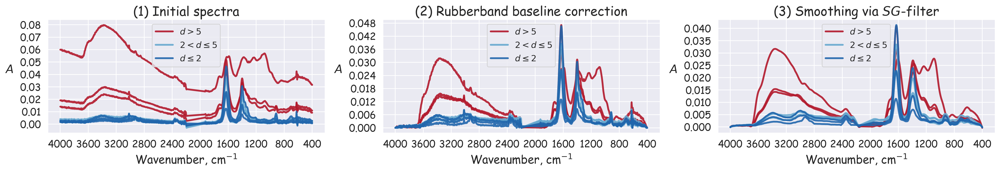

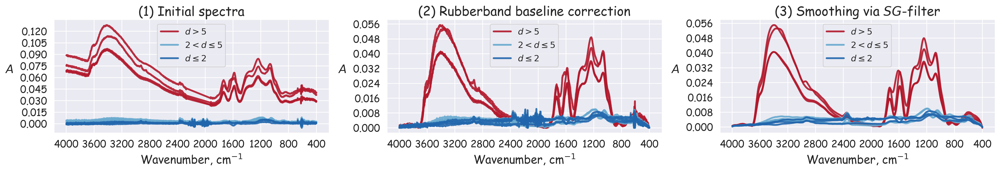

In [40]:
nrows = 1
ncols = 3

for i, division in enumerate([np.int64(9), np.int64(10)]):

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 6.5, nrows * 3.5), dpi=300)
    
    idx_lst = samples_description.loc[samples_description['Division'] == division].index

    initial_data_vis = initial_data.loc[idx_lst]
    data_bc_vis = data_bc.loc[idx_lst]
    data_smoothed_vis = data_smoothed.loc[idx_lst]

    for j, tmp_data in enumerate([initial_data_vis, data_bc_vis, data_smoothed_vis]):

        if i > 1:
            custom_plot_params["TITLE"] = ''
        else:
            custom_plot_params["TITLE"] = '(1) Initial spectra' if j == 0 else '(2) Rubberband baseline correction' if j == 1 else '(3) Smoothing via $SG$-filter'
        
        plot_spectra(
            data_vis=tmp_data,
            ax=axes[j],
            samples_description=samples_description,
            hue_column='Fraction_grouped_hue',  # Fraction_hue, Fraction_grouped_hue
            plot_params=custom_plot_params,
            style_params=custom_style,
            legend_params=custom_legend
        )

    plt.tight_layout()
    plt.savefig(f'{path_to_save}/raw_bc_smoothed_spectra_div{division}.svg', dpi=600)
    plt.show()

## Spectrum for graphical abstract

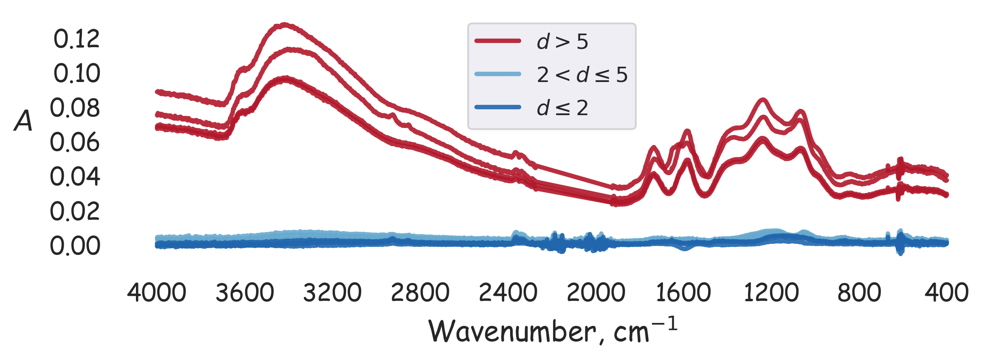

In [41]:
nrows = 1
ncols = 1

division = 10

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8, 3), dpi=300)

fig.patch.set_alpha(0.0)
axes.set_facecolor('none')

idx_lst = samples_description.loc[samples_description['Division'] == division].index

initial_data_vis = initial_data.loc[idx_lst]
data_bc_vis = data_bc.loc[idx_lst]
data_smoothed_vis = data_smoothed.loc[idx_lst]

custom_plot_params["Y_NBINS"] = 8
custom_plot_params["TITLE"] = ''
    
plot_spectra(
    data_vis=initial_data_vis,
    ax=axes,
    samples_description=samples_description,
    hue_column='Fraction_grouped_hue',  # Fraction_hue, Fraction_grouped_hue
    plot_params=custom_plot_params,
    style_params=custom_style,
    legend_params=custom_legend
)

plt.tight_layout()
plt.savefig(f'{path_to_save}/spectrum_graphical_abstract.png', dpi=1800)
plt.show()

## Preprocessing pipeline ($ID_{div} = 10$) — panel

### Data wrangling

In [42]:
division = 10
idx_lst = samples_description.loc[samples_description['Division'] == division].index

In [43]:
initial_data_vis = initial_data.loc[idx_lst]
data_bc_vis = data_bc.loc[idx_lst]
data_smoothed_vis = data_smoothed.loc[idx_lst]
data_scaled_3800_2500 = data_scaled_ranges[(3800, 2500)].loc[idx_lst]
data_scaled_1900_800 = data_scaled_ranges[(1900, 800)].loc[idx_lst]

### Visualization

In [44]:
style_cfg = {
    "X_LABEL_FONT_SIZE": 18, "Y_LABEL_FONT_SIZE": 18,
    "X_TICK_FONT_SIZE": 16,  "Y_TICK_FONT_SIZE": 16,
    "TITLE_FONT_SIZE": 20,
    "TITLE_WEIGHT": "bold",
    "TITLE_COLOR": "black",
    "HIGHLIGHT_COLOR": "lightblue", # 'lightblue', 'powderblue' | 'aliceblue' | 'lightgray' | 'gainsboro' | 'whitesmoke'
    "HIGHLIGHT_ALPHA": 0.30,
    "BOUNDARY_LINE_COLOR": "lightblue",
    "BOUNDARY_LINEWIDTH": 1.0,
    "BOUNDARY_LINESTYLE": "-",
    "BOUNDARY_ALPHA": 1.00,
}


plot_cfg  = {
    "X_LABEL": 'Wavenumber, cm$^{-1}$', "Y_LABEL": '$A$', "TITLE": '',
    "Y_LABELPAD": 12, "X_LABELPAD": 6,
    "X_NBINS": 10, "Y_NBINS": 8,
    "X_STEP": None, "Y_STEP": None,
    "LINEWIDTH": 3.0, "ALPHA": 0.85, "COLORMAP": type_color_cmap
}


legend_cfg = {"TITLE": 'Size fraction, μm', "FONTSIZE": 16, "TITLE_FONTSIZE": 18}

hue_col = ('Fraction_hue' if 'Fraction_hue' in samples_description.columns
           else ('Fraction_grouped_hue' if 'Fraction_grouped_hue' in samples_description.columns
                 else None))

panels = [
    ("A", "(A) Initial (raw) spectra",                                            sort_columns_numeric(initial_data_vis),            200, None),
    ("B", "(B) Rubber-band baseline correction",                                  sort_columns_numeric(data_bc_vis),                 200, None),
    ("C", "(C) Smoothing via Savitzky-Golay filter & wavenumber range selection", sort_columns_numeric(data_smoothed_vis),           200, None),
    ("D", "(D) Normalization (3800–2500 cm$^{-1}$)",                              sort_columns_numeric(data_scaled_3800_2500),       200, 0.2),
    ("E", "(E) Normalization (1900–800 cm$^{-1}$)",                               sort_columns_numeric(data_scaled_1900_800),        100, 0.2),
]

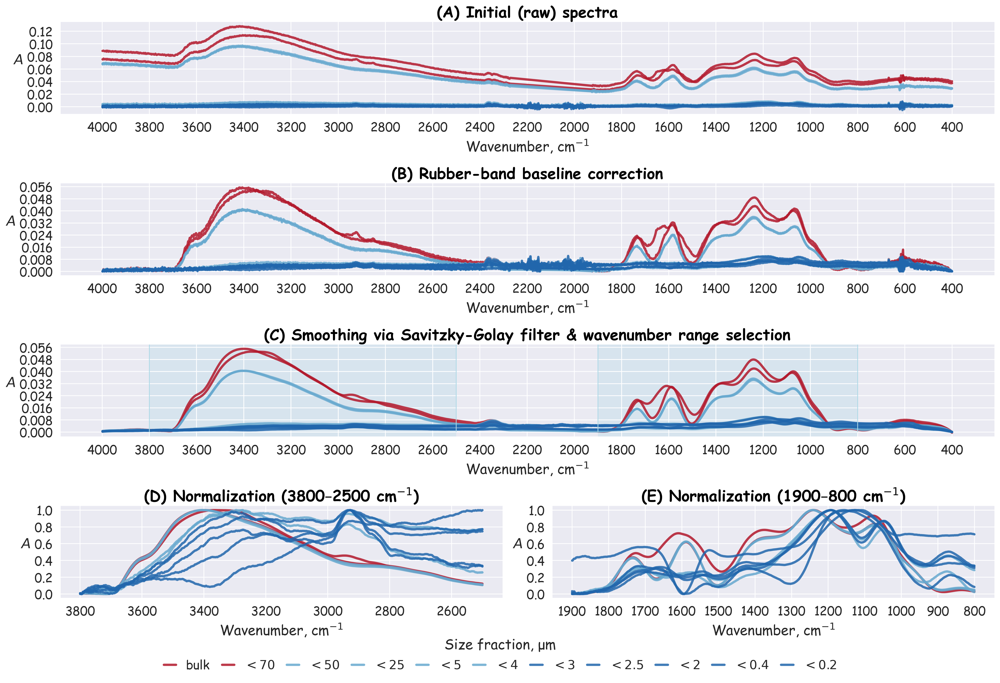

In [45]:
mosaic = [
    [panels[0][0], panels[0][0]],
    [panels[1][0], panels[1][0]],
    [panels[2][0], panels[2][0]],
    [panels[3][0], panels[4][0]],
]

scale_factor = 2.2
fig, axd = plt.subplot_mosaic(mosaic, figsize=(scale_factor * 8.27, scale_factor * 5.83), dpi=300)

handles_all, labels_all = [], []

for pid, title, data, xstep, ystep in panels:
    draw_panel(axd[pid], data, title, x_step=xstep, y_step=ystep)

HIGHLIGHT_RANGES = [(3800, 2500), (1900, 800)]
if "C" in axd:
    axC = axd["C"]

    # сохраняем текущие лимиты и считаем старт для линий: не ниже нуля
    y_min, y_max = axC.get_ylim()
    y0 = max(0, y_min)

    for a, b in HIGHLIGHT_RANGES:
        lo, hi = sorted((a, b))
        axC.axvspan(
            lo, hi,
            facecolor=style_cfg["HIGHLIGHT_COLOR"],
            alpha=style_cfg["HIGHLIGHT_ALPHA"],
            edgecolor="none",
            zorder=0
        )
        axC.vlines(
            [lo, hi],
            y0, y_max,
            colors=style_cfg["BOUNDARY_LINE_COLOR"],
            linewidth=style_cfg["BOUNDARY_LINEWIDTH"],
            linestyles=style_cfg["BOUNDARY_LINESTYLE"],
            alpha=style_cfg["BOUNDARY_ALPHA"],
            zorder=6
        )
    axC.set_ylim(y_min, y_max)

labels_all = ['bulk' if str(lbl).strip() == r'$> 0$' else lbl for lbl in labels_all]
handles_u, labels_u = unique_legend(handles_all, labels_all)

bottom_margin = 0.08
plt.tight_layout(rect=(0, bottom_margin, 1, 1))

leg = fig.legend(
    handles_u, labels_u,
    title=legend_cfg["TITLE"],
    ncol=len(labels_u),
    loc='lower center',
    bbox_to_anchor=(0.5, bottom_margin/2),
    frameon=False,
    fontsize=legend_cfg["FONTSIZE"],
    title_fontsize=legend_cfg["TITLE_FONTSIZE"],
    handlelength=1.0,
    borderaxespad=0.0,
    columnspacing=1.0
)

fig.savefig(f'{path_to_save}/panel_preprocessing_pipeline_div_{division}.png', dpi=1800, bbox_inches='tight', pad_inches=0.02)

plt.show()

# Saving data

In [26]:
path_to_save_data = './../data/preprocessed_data'

## Smoothed data & smothed data by region

In [27]:
data_smoothed.to_csv(f'{path_to_save_data}/smoothed_data/ftir_smoothed_4000_650.csv', sep=';')
data_smoothed.T.to_csv(f'{path_to_save_data}/smoothed_data/ftir_smoothed_4000_650_transposed.csv', sep=';')

for range_, tmp_data in data_smoothed_ranges.items():
    tmp_data.to_csv(f'{path_to_save_data}/smoothed_data/ftir_smoothed_{range_[0]}_{range_[1]}.csv', sep=';')

## Scaled data by region

In [28]:
for range, tmp_data in data_scaled_ranges.items():
    tmp_data.to_csv(f'{path_to_save_data}/scaled_data/ftir_scaled_{range[0]}_{range[1]}.csv', sep=';')